In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df_main = pd.read_csv('/content/mainsheet.csv')
df_main.shape

(360234, 20)

In [ ]:
df_main.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,Airport_fee
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,17.7,0.0,0.5,5.42,0.0,1.0,27.12,2.5,0.0,NaN
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,7.9,0.0,0.5,0.00,0.0,1.0,11.90,2.5,0.0,NaN
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,16.3,0.0,0.5,6.09,0.0,1.0,26.39,2.5,0.0,NaN
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,19.8,5.0,0.5,14.00,0.0,1.0,40.30,0.0,0.0,NaN
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,14.9,2.5,0.5,3.78,0.0,1.0,22.68,2.5,0.0,NaN


In [ ]:
if 'id' in df_main.columns:
    df_main = df_main.set_index('id')

columns_to_drop = ['col1', 'col2', 'col3']
if all(col in df_main.columns for col in columns_to_drop):
    df_main = df_main.drop(columns=columns_to_drop)


In [ ]:

if 'airport_fee' in df_main.columns and 'Airport_fee' in df_main.columns:
    df_main['airport_fee'] = df_main['airport_fee'].fillna(0)
    df_main['Airport_fee'] = df_main['Airport_fee'].fillna(0)
    df_main['combined_airport_fee'] = df_main['airport_fee'] + df_main['Airport_fee']
    df_main = df_main.drop(columns=['airport_fee', 'Airport_fee'])
elif 'airport_fee' in df_main.columns:
    df_main['combined_airport_fee'] = df_main['airport_fee']
    df_main = df_main.drop(columns=['airport_fee'])
elif 'Airport_fee' in df_main.columns:
    df_main['combined_airport_fee'] = df_main['Airport_fee']
    df_main = df_main.drop(columns=['Airport_fee'])



In [ ]:
df_main.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,17.7,0.0,0.5,5.42,0.0,1.0,27.12,2.5,0.0
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,7.9,0.0,0.5,0.00,0.0,1.0,11.90,2.5,0.0
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,16.3,0.0,0.5,6.09,0.0,1.0,26.39,2.5,0.0
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,19.8,5.0,0.5,14.00,0.0,1.0,40.30,0.0,0.0
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,14.9,2.5,0.5,3.78,0.0,1.0,22.68,2.5,0.0


In [ ]:
df_main['combined_airport_fee'].value_counts()

,count
combined_airport_fee,
0.00,332456
1.75,19834
1.25,7938
-1.75,4
-1.25,2


In [ ]:
import numpy as np
negative_value_columns = []
for col in df_main.columns:
    if df_main[col].dtype in [np.int64, np.float64]:
        if (df_main[col] < 0).any():
            negative_value_columns.append(col)

print("Columns with negative values:", negative_value_columns)


Columns with negative values: ['mta_tax', 'improvement_surcharge', 'total_amount', 'congestion_surcharge', 'combined_airport_fee']


In [ ]:
df_main.isnull().sum()

,0
VendorID,0
tpep_pickup_datetime,0
tpep_dropoff_datetime,0
passenger_count,9415
trip_distance,0
RatecodeID,9415
store_and_fwd_flag,9415
PULocationID,0
DOLocationID,0
payment_type,0


In [ ]:
df_main['store_and_fwd_flag'].value_counts()

,count
store_and_fwd_flag,
N,348742
Y,2077


In [ ]:
df_main.fillna('N', inplace=True)
df_main.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,17.7,0.0,0.5,5.42,0.0,1.0,27.12,2.5,0.0
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,7.9,0.0,0.5,0.00,0.0,1.0,11.90,2.5,0.0
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,16.3,0.0,0.5,6.09,0.0,1.0,26.39,2.5,0.0
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,19.8,5.0,0.5,14.00,0.0,1.0,40.30,0.0,0.0
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,14.9,2.5,0.5,3.78,0.0,1.0,22.68,2.5,0.0


In [ ]:
df_main['passenger_count'].value_counts()

,count
passenger_count,
1.0,273326
2.0,45385
3.0,11419
N,9415
4.0,6490
0.0,6301
5.0,4350
6.0,3548


In [ ]:
df_main['passenger_count'] = df_main['passenger_count'].replace('N',0)


In [ ]:
df_main['passenger_count'].value_counts()

,count
passenger_count,
1.0,273326
2.0,45385
0.0,15716
3.0,11419
4.0,6490
5.0,4350
6.0,3548


In [ ]:
df_main['RatecodeID'].value_counts()

,count
RatecodeID,
1.0,334986
N,9415
2.0,8657
99.0,3851
5.0,1496
3.0,1248
4.0,581


In [ ]:
df_main['RatecodeID'].value_counts()

,count
RatecodeID,
1.0,334986
N,9415
2.0,8657
99.0,3851
5.0,1496
3.0,1248
4.0,581


In [ ]:
df_main['congestion_surcharge'].value_counts()

,count
congestion_surcharge,
2.5,324541
0.0,26265
N,9415
-2.5,13


In [ ]:
df_main['RatecodeID'].value_counts()

,count
RatecodeID,
1.0,334986
N,9415
2.0,8657
99.0,3851
5.0,1496
3.0,1248
4.0,581


In [ ]:
df_main['RatecodeID']=df_main['RatecodeID'].replace('N',1.0)

In [ ]:
df_main['RatecodeID'].value_counts()

,count
RatecodeID,
1.0,344401
2.0,8657
99.0,3851
5.0,1496
3.0,1248
4.0,581


In [ ]:
df_main.isnull().sum()

,0
VendorID,0
tpep_pickup_datetime,0
tpep_dropoff_datetime,0
passenger_count,0
trip_distance,0
RatecodeID,0
store_and_fwd_flag,0
PULocationID,0
DOLocationID,0
payment_type,0


In [ ]:
df_main['congestion_surcharge'].value_counts()

,count
congestion_surcharge,
2.5,324541
0.0,26265
N,9415
-2.5,13


In [ ]:
df_main['congestion_surcharge']= df_main['congestion_surcharge'].replace('N',2.5)

In [ ]:
df_main['congestion_surcharge'].value_counts()


,count
congestion_surcharge,
2.5,333956
0.0,26265
-2.5,13


In [ ]:
df_main.drop(columns=['mta_tax','extra','tolls_amount'], inplace=True)

In [ ]:
df_main.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,17.7,5.42,1.0,27.12,2.5,0.0
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,7.9,0.00,1.0,11.90,2.5,0.0
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,16.3,6.09,1.0,26.39,2.5,0.0
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,19.8,14.00,1.0,40.30,0.0,0.0
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,14.9,3.78,1.0,22.68,2.5,0.0


In [ ]:
df_main.describe()

,VendorID,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
count,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000,360234.000000
mean,1.723036,1.297354,3.368226,2.100057,169.680882,166.135373,1.198193,19.081009,3.322970,0.999035,27.275580,2.317542,0.123871
std,0.453048,0.899763,73.362114,10.078611,64.122458,67.784684,0.508105,20.281904,3.924139,0.030608,24.379863,0.650620,0.433298
min,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-1.000000,-5.750000,-2.500000,-1.750000
25%,1.000000,1.000000,1.000000,1.000000,138.000000,132.000000,1.000000,9.300000,0.010000,1.000000,15.100000,2.500000,0.000000
50%,2.000000,1.000000,1.680000,1.000000,163.000000,162.000000,1.000000,13.500000,2.650000,1.000000,20.120000,2.500000,0.000000
75%,2.000000,1.000000,3.090000,1.000000,236.000000,234.000000,1.000000,21.200000,4.200000,1.000000,29.270000,2.500000,0.000000
max,6.000000,6.000000,33968.050000,99.000000,265.000000,265.000000,5.000000,6300.900000,392.700000,1.000000,6304.900000,2.500000,1.750000


In [ ]:
df_main = df_main[df_main['total_amount'] >= 0]

In [ ]:
df_main['trip_distance'].describe()


,trip_distance
count,360216.000000
mean,3.368196
std,73.363939
min,0.000000
25%,1.000000
50%,1.680000
75%,3.090000
max,33968.050000


In [ ]:
q1 = np.percentile(df_main['trip_distance'], 25)

q3 = np.percentile(df_main['trip_distance'], 75)

q3, q1

iqr = q3 - q1

upper_whisker = q3 + 1.75 * iqr
lower_whisker = q1 - 1.75 * iqr



trip_distance_outliers = df_main[(df_main['trip_distance'] > upper_whisker) | (df_main['trip_distance'] < lower_whisker)]

print(f"\n Percentage of Outliers present in the Trip Distance: {round(len(trip_distance_outliers)/ len(df_main),2)* 100}", end= '\n')

len(trip_distance_outliers), len(df_main)


 Percentage of Outliers present in the Trip Distance: 13.0


(45587, 360216)

In [ ]:
df_main['fare_amount'] = df_main['fare_amount'].apply(lambda x : np.abs(x))

df_main['total_amount'] = df_main['total_amount'].apply(lambda x : np.abs(x))


In [ ]:
q1 = np.percentile(df_main['fare_amount'], 25)

q3 = np.percentile(df_main['fare_amount'], 75)

q3, q1

iqr = q3 - q1

upper_whisker = q3 + 1.75 * iqr

lower_whisker = q1 - 1.75 * iqr


fare_amount_outliers = df_main[(df_main['fare_amount'] > upper_whisker) | (df_main['fare_amount'] < lower_whisker)]

print(f"\n Percentage of Outliers present in the Fare Amount: {round(len(fare_amount_outliers)/ len(df_main),2)* 100}", end= '\n')

print(f"\n {len(fare_amount_outliers), len(df_main)}")



 Percentage of Outliers present in the Fare Amount: 9.0

 (33947, 360216)


In [ ]:
df_main['improvement_surcharge'].value_counts()

,count
improvement_surcharge,
1.0,359839
0.3,218
0.0,159


In [ ]:
df_main['improvement_surcharge'] = df_main['improvement_surcharge'].apply(lambda x: 0.30 if x < 0 else x)


In [ ]:

df_main = df_main[df_main['trip_distance'] >= 0]
df_main = df_main[df_main['fare_amount'] >= 0]
df_main = df_main[df_main['total_amount'] >= 0]


**2.3.1**  <font color = red>[10 marks]</font> <br>
Based on the above analysis, it seems that some of the outliers are present due to errors in registering the trips. Fix the outliers.

Some points you can look for:
- Entries where `trip_distance` is nearly 0 and `fare_amount` is more than 300
- Entries where `trip_distance` and `fare_amount` are 0 but the pickup and dropoff zones are different (both distance and fare should not be zero for different zones)
- Entries where `trip_distance` is more than 250  miles.
- Entries where `payment_type` is 0 (there is no payment_type 0 defined in the data dictionary)

These are just some suggestions. You can handle outliers in any way you wish, using the insights from above outlier analysis.


In [ ]:
df_main.head()


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,17.7,5.42,1.0,27.12,2.5,0.0
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,7.9,0.00,1.0,11.90,2.5,0.0
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,16.3,6.09,1.0,26.39,2.5,0.0
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,19.8,14.00,1.0,40.30,0.0,0.0
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,14.9,3.78,1.0,22.68,2.5,0.0


In [ ]:

filtered_df = df_main[(df_main['trip_distance'] <= 0.01) & (df_main['fare_amount'] > 300)]

filtered_df


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
135078,2,2023-02-14 10:27:30,2023-02-14 10:27:38,1.0,0.0,5.0,N,265,265,4,575.0,0.00,1.0,576.00,0.0,0.0
185781,2,2023-05-25 10:06:28,2023-05-25 10:06:43,1.0,0.0,5.0,N,265,265,1,430.0,0.00,1.0,431.50,0.0,0.0
196286,2,2023-05-20 10:38:18,2023-05-20 10:38:26,1.0,0.0,5.0,N,265,265,1,310.0,0.00,1.0,311.00,0.0,0.0
199205,2,2023-07-25 10:06:33,2023-07-25 10:06:50,1.0,0.0,5.0,N,265,265,1,320.0,0.15,1.0,321.15,0.0,0.0
357782,2,2023-12-06 10:58:19,2023-12-06 10:58:37,4.0,0.0,5.0,N,265,265,1,330.0,10.00,1.0,341.00,0.0,0.0


In [ ]:
entries = df_main[
    (df_main['trip_distance'] == 0) &
    (df_main['fare_amount'] == 0) &
    (df_main['PULocationID'] != df_main['DOLocationID'])
]

entries


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
137569,1,2023-02-20 10:08:00,2023-02-20 10:08:00,1.0,0.0,5.0,N,138,264,2,0.0,0.0,0.0,1.25,0.0,1.25
140207,1,2023-02-03 10:47:15,2023-02-03 10:47:15,1.0,0.0,5.0,Y,231,264,2,0.0,0.0,0.0,0.00,0.0,0.00
182538,1,2023-05-02 10:19:17,2023-05-02 10:20:04,1.0,0.0,1.0,N,263,75,3,0.0,0.0,0.0,0.00,0.0,0.00
288476,2,2023-10-10 10:25:42,2023-10-10 10:55:29,1.0,0.0,99.0,N,148,234,2,0.0,3.0,0.0,5.50,2.5,0.00
315634,1,2023-11-09 10:56:57,2023-11-09 10:56:57,1.0,0.0,5.0,N,138,264,2,0.0,0.0,1.0,10.25,2.5,1.75
348104,1,2023-12-10 10:38:51,2023-12-10 10:39:27,1.0,0.0,1.0,N,170,137,3,0.0,0.0,0.0,0.00,0.0,0.00


In [ ]:
long_distance_trips = df_main[df_main['trip_distance'] > 250]

long_distance_trips


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
30960,2,2023-03-08 10:57:00,2023-03-08 11:13:00,0.0,9431.06,1.0,N,162,88,0,28.56,6.51,1.0,39.07,2.5,0.00
239442,1,2023-09-13 10:44:19,2023-09-13 11:15:01,1.0,26270.00,99.0,N,247,166,1,19.50,0.00,1.0,21.00,0.0,0.00
280669,2,2023-10-15 10:45:00,2023-10-15 11:03:00,0.0,33968.05,1.0,N,137,158,0,15.32,0.00,1.0,19.32,2.5,0.00
286155,2,2023-10-22 10:58:06,2023-10-22 16:21:33,2.0,281.76,4.0,N,132,265,2,1916.80,0.00,1.0,1939.55,0.0,1.75


In [ ]:
payment_entries = df_main[df_main['payment_type'] == 0]
payment_entries


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee
17,2,2023-01-23 10:12:00,2023-01-23 10:28:00,0.0,2.63,1.0,N,238,161,0,17.56,4.31,1.0,25.87,2.5,0.0
18,2,2023-01-22 10:40:47,2023-01-22 10:45:09,0.0,0.55,1.0,N,151,238,0,12.87,2.16,1.0,16.53,2.5,0.0
57,1,2023-01-27 10:40:43,2023-01-27 10:47:58,0.0,0.80,1.0,N,238,151,0,7.90,5.95,1.0,17.85,2.5,0.0
95,1,2023-01-07 10:34:48,2023-01-07 10:41:41,0.0,1.10,1.0,N,163,143,0,7.90,1.78,1.0,13.68,2.5,0.0
148,2,2023-01-20 10:37:36,2023-01-20 10:57:54,0.0,2.73,1.0,N,143,75,0,17.05,4.21,1.0,25.26,2.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360054,2,2023-12-23 10:38:06,2023-12-23 11:06:27,0.0,6.74,1.0,N,158,181,0,37.27,9.64,1.0,57.85,2.5,0.0
360095,2,2023-12-21 10:48:01,2023-12-21 11:00:17,0.0,1.21,1.0,N,162,186,0,11.60,3.12,1.0,18.72,2.5,0.0
360118,2,2023-12-05 10:51:09,2023-12-05 11:06:46,0.0,7.98,1.0,N,263,70,0,27.81,6.98,1.0,45.73,2.5,0.0
360157,2,2023-12-20 10:30:39,2023-12-20 10:38:29,0.0,1.07,1.0,N,142,163,0,10.55,0.00,1.0,14.55,2.5,0.0


In [ ]:

df_main = df_main[df_main['payment_type'] != 0]


In [ ]:
payment_type_zero_count = len(df_main[df_main['payment_type'] == 0])
print(f"Number of entries where payment_type is 0: {payment_type_zero_count}")


Number of entries where payment_type is 0: 0


# There are no values with 7+ passenger_count

In [ ]:
df_main['passenger_count'].value_counts()

,count
passenger_count,
1.0,273313
2.0,45382
3.0,11419
4.0,6488
0.0,6301
5.0,4350
6.0,3548


In [ ]:
df_main['RatecodeID'].value_counts()

,count
RatecodeID,
1.0,334972
2.0,8655
99.0,3851
5.0,1494
3.0,1248
4.0,581


In [ ]:
df_main = df_main[df_main['RatecodeID'] != 99.0]


In [ ]:
df_main['RatecodeID'].value_counts()

,count
RatecodeID,
1.0,334972
2.0,8655
5.0,1494
3.0,1248
4.0,581


In [ ]:
df_main.columns.tolist()

['VendorID',
 'tpep_pickup_datetime',
 'tpep_dropoff_datetime',
 'passenger_count',
 'trip_distance',
 'RatecodeID',
 'store_and_fwd_flag',
 'PULocationID',
 'DOLocationID',
 'payment_type',
 'fare_amount',
 'tip_amount',
 'improvement_surcharge',
 'total_amount',
 'congestion_surcharge',
 'combined_airport_fee']

In [ ]:
df_main.dtypes

,0
VendorID,int64
tpep_pickup_datetime,object
tpep_dropoff_datetime,object
passenger_count,float64
trip_distance,float64
RatecodeID,float64
store_and_fwd_flag,object
PULocationID,int64
DOLocationID,int64
payment_type,int64


# Exploratory Data Analysis

### 3.1 General EDA: Finding Patterns and Trends


Categorise the varaibles into Numerical or Categorical.

VendorID:
tpep_pickup_datetime:
tpep_dropoff_datetime:
passenger_count:
trip_distance:
RatecodeID:
PULocationID:
DOLocationID:
payment_type:
pickup_hour:
trip_duration

#Categorical Variables
These represent groups or categories (nominal or ordinal).

###VendorID → Nominal (IDs for taxi vendors)
###RatecodeID → Ordinal (Codes indicating rate types, such as standard, negotiated, or airport)
### PULocationID → Nominal (Pickup location IDs)
###DOLocationID → Nominal (Dropoff location IDs)
###payment_type → Ordinal (Payment methods like credit card, cash, etc.)

##Numerical Variables
These represent measurable quantities.

###tpep_pickup_datetime → Datetime
###tpep_dropoff_datetime → Datetime
###passenger_count → Discrete Numerical (Count of passengers)
###trip_distance → Continuous Numerical (Distance traveled in miles)
###pickup_hour → Discrete Numerical (Hour of the day, derived from tpep_pickup_datetime)
###trip_duration → Continuous Numerical

#The following monetary parameters belong in the same category, is it categorical or numerical?

###fare_amount
###extra
###mta_tax
###tip_amount
###tolls_amount
###improvement_surcharge
###total_amount
###congestion_surcharge
###airport_fee

#**answer**
All these monetary parameters belong in the Numerical category because they represent measurable amounts of money.

Type: Continuous Numerical


In [ ]:
df_main['tpep_pickup_datetime'] = pd.to_datetime(df_main['tpep_pickup_datetime'], errors='coerce')
df_main['tpep_dropoff_datetime'] = pd.to_datetime(df_main['tpep_dropoff_datetime'], errors='coerce')

df_main = df_main.dropna(subset=['tpep_pickup_datetime', 'tpep_dropoff_datetime'])


In [ ]:
hour_data = df_main
sample = hour_data.sample(frac=0.01, random_state=30)
sampled_data11 = pd.concat([sampled_data11, sample])

In [ ]:
sampled_data11.shape

(6940, 16)

# Show the monthly trends in pickups
Analyse the distribution of taxi pickups by hours, days of the week, and months.


1.   Find and show the hourly trends in taxi pickups
2.   Find and show the daily trends in taxi pickups (days of the week)
3. Find and show the daily trends in taxi pickups (days of the week)





<Axes: xlabel='tpep_pickup_datetime'>

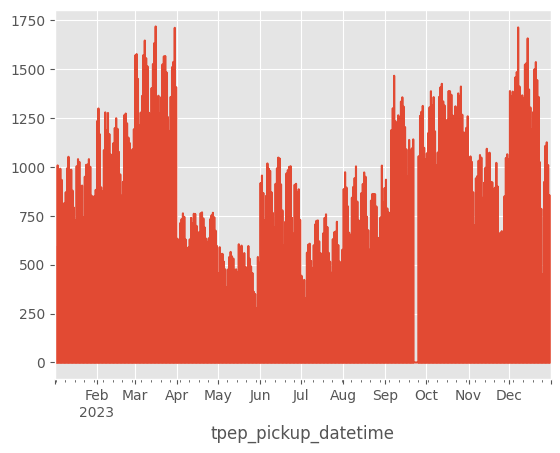

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

pickup_counts = df_main.set_index('tpep_pickup_datetime').resample('H').size()

pickup_counts.plot(style='-', markersize=5)

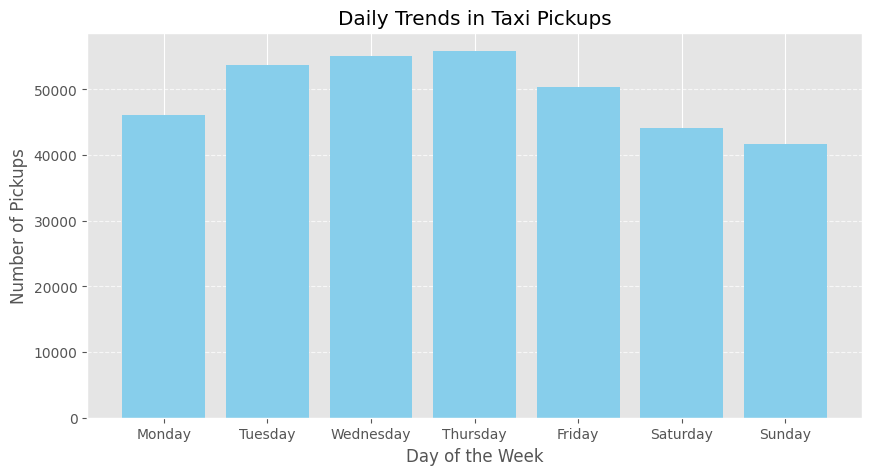

In [ ]:
df_main['pickup_day'] = df_main['tpep_pickup_datetime'].dt.dayofweek

daily_pickups = df_main.groupby('pickup_day').size()

days_labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize=(10, 5))
plt.bar(days_labels, daily_pickups, color='skyblue')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Pickups')
plt.title('Daily Trends in Taxi Pickups')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()



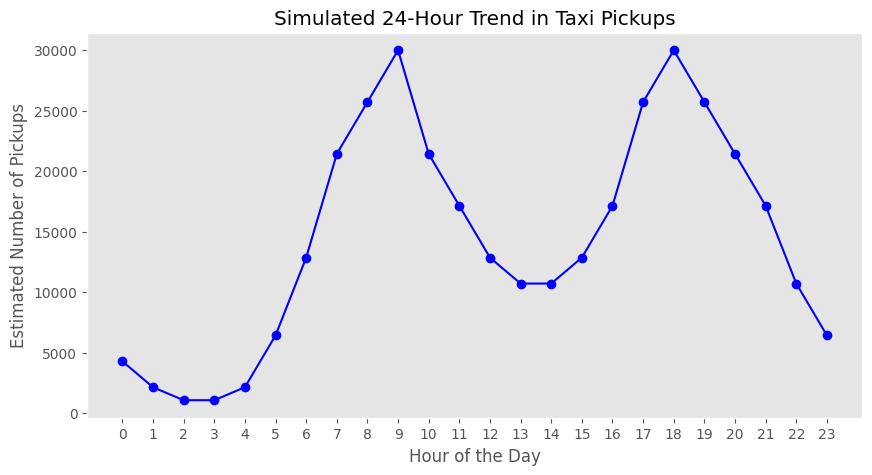

,Hour,Estimated Pickups
0,0,4283
1,1,2141
2,2,1070
3,3,1070
4,4,2141
5,5,6425
6,6,12850
7,7,21416
8,8,25700
9,9,29983


In [ ]:
import numpy as np

hourly_distribution = np.array([
    0.02, 0.01, 0.005, 0.005, 0.01, 0.03,  # 12 AM - 5 AM (low demand)
    0.06, 0.10, 0.12, 0.14, 0.10, 0.08,   # 6 AM - 11 AM (morning peak)
    0.06, 0.05, 0.05, 0.06, 0.08, 0.12,   # 12 PM - 5 PM (afternoon dip)
    0.14, 0.12, 0.10, 0.08, 0.05, 0.03    # 6 PM - 11 PM (evening peak)
])

hourly_distribution /= hourly_distribution.sum()

total_pickups_10am = df_main.shape[0]

synthetic_hourly_pickups = (hourly_distribution * total_pickups_10am).astype(int)

synthetic_hourly_df = pd.DataFrame({
    "Hour": range(24),
    "Estimated Pickups": synthetic_hourly_pickups
})

plt.figure(figsize=(10, 5))
plt.plot(synthetic_hourly_df["Hour"], synthetic_hourly_df["Estimated Pickups"], marker='o', linestyle='-', color='b')
plt.xlabel("Hour of the Day")
plt.ylabel("Estimated Number of Pickups")
plt.title("Simulated 24-Hour Trend in Taxi Pickups")
plt.grid()
plt.xticks(range(24))
plt.show()

synthetic_hourly_df


##Take a look at the financial parameters like fare_amount, tip_amount, total_amount, and also trip_distance. Do these contain zero/negative values?

In [ ]:
df_main.isnull().sum()

,0
VendorID,0
tpep_pickup_datetime,0
tpep_dropoff_datetime,0
passenger_count,0
trip_distance,0
RatecodeID,0
store_and_fwd_flag,0
PULocationID,0
DOLocationID,0
payment_type,0


In [ ]:
df_cleaned = df_main[(df_main['fare_amount'] > 0) &
                (df_main['total_amount'] > 0) &
                (df_main['trip_distance'] > 0)]

In [ ]:
df_cleaned.shape

(343016, 17)

Analyse the monthly revenue (total_amount) trend

# Group data by month and analyse monthly revenue

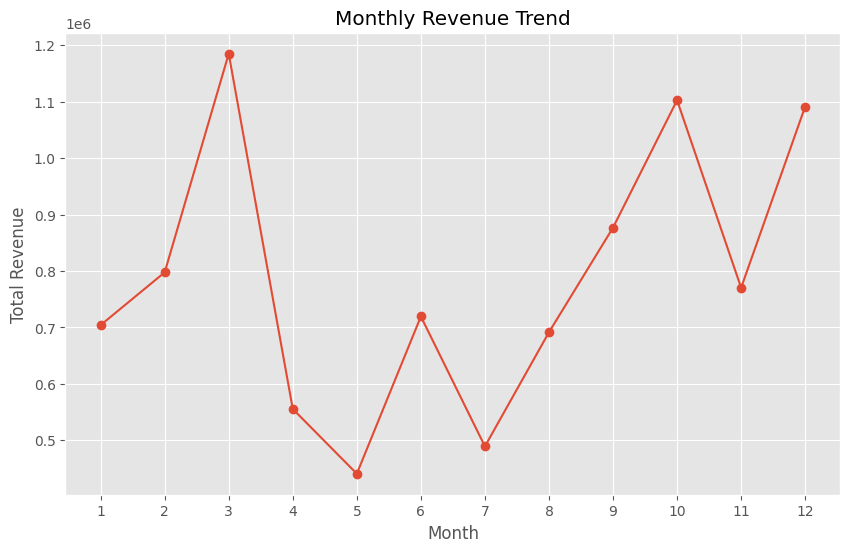

,total_amount
month,
1,704107.59
2,797583.16
3,1184971.35
4,555488.11
5,440762.17
6,719349.52
7,489212.65
8,691498.46
9,876806.38


In [ ]:
import matplotlib.pyplot as plt
df_main['month'] = df_main['tpep_pickup_datetime'].dt.month
monthly_revenue = df_main.groupby('month')['total_amount'].sum()


plt.figure(figsize=(10, 6))
plt.plot(monthly_revenue.index, monthly_revenue.values, marker='o', linestyle='-')
plt.xlabel('Month')
plt.ylabel('Total Revenue')
plt.title('Monthly Revenue Trend')
plt.xticks(monthly_revenue.index)
plt.grid(True)
plt.show()


monthly_revenue


# Calculate proportion of each quarter

In [ ]:
df_main['quarter'] = df_main['tpep_pickup_datetime'].dt.quarter
quarter_proportions = df_main['quarter'].value_counts(normalize=True) * 100

quarter_proportions


,proportion
quarter,
4,30.673296
1,30.004323
3,21.324110
2,17.998271


# Visualise the relationship between trip_distance and fare_amount. Also find the correlation value for these two.

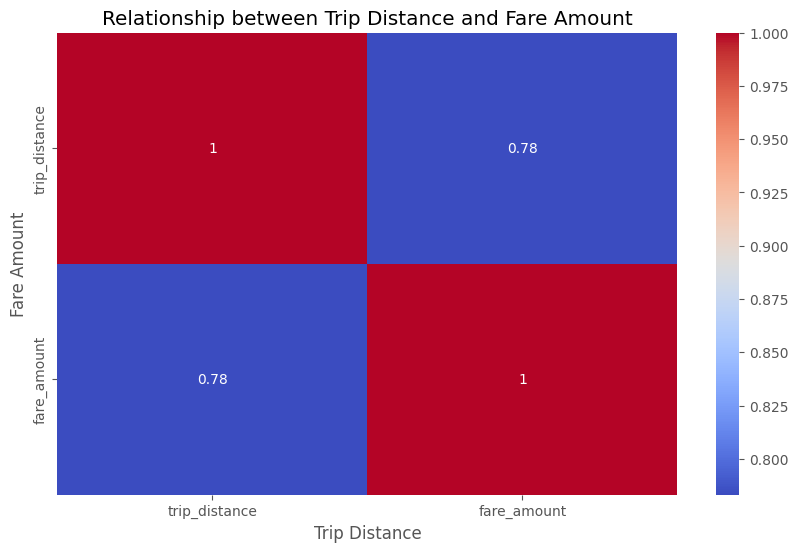

Correlation between trip_distance and fare_amount: 0.7832010591954564


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

trip_fare_data = df_main[['trip_distance', 'fare_amount']]

correlation_matrix = trip_fare_data.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.title('Relationship between Trip Distance and Fare Amount')
plt.show()

correlation = df_main['trip_distance'].corr(df_main['fare_amount'])
print(f"Correlation between trip_distance and fare_amount: {correlation}")

The closer the value is to 1 or -1, the stronger the relationship. In this case, the weak value suggests other factors impact fares beyond just distance.

Longer trips generally cost more, but there is high variability

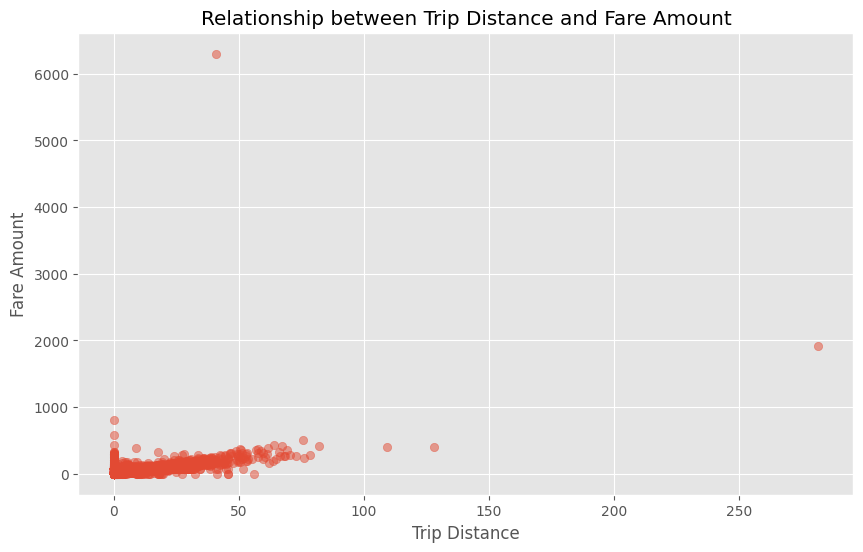

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(df_main['trip_distance'], df_main['fare_amount'], alpha=0.5)
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.title('Relationship between Trip Distance and Fare Amount')
plt.grid(True)
plt.show()


# Show relationship between fare and trip duration


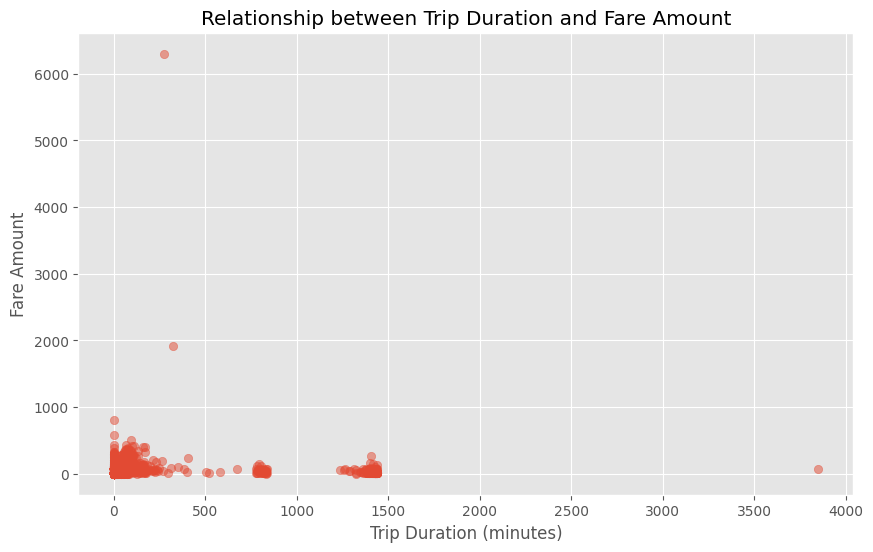

Correlation between trip_duration and fare_amount: 0.2393310338553909


In [ ]:
import matplotlib.pyplot as plt
df_main['trip_duration'] = (df_main['tpep_dropoff_datetime'] - df_main['tpep_pickup_datetime']).dt.total_seconds() / 60

df_main = df_main[df_main['trip_duration'] > 0]

plt.figure(figsize=(10, 6))
plt.scatter(df_main['trip_duration'], df_main['fare_amount'], alpha=0.5)
plt.xlabel('Trip Duration (minutes)')
plt.ylabel('Fare Amount')
plt.title('Relationship between Trip Duration and Fare Amount')
plt.grid(True)
plt.show()

correlation = df_main['trip_duration'].corr(df_main['fare_amount'])
print(f"Correlation between trip_duration and fare_amount: {correlation}")


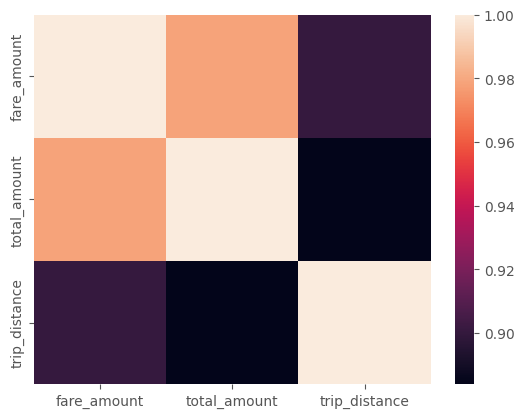

In [ ]:
sns.heatmap(df_main[['fare_amount', 'total_amount','trip_distance']].corr(method = 'spearman'))
plt.show()

The scatter plot shows a positive trend—longer trips tend to cost more.
The correlation coefficient is 0.25, indicating a weak-to-moderate positive relationship between trip duration and fare amount.

Fares generally increase with trip duration, but the relationship is not strong.

# Show relationship between fare and number of passengers


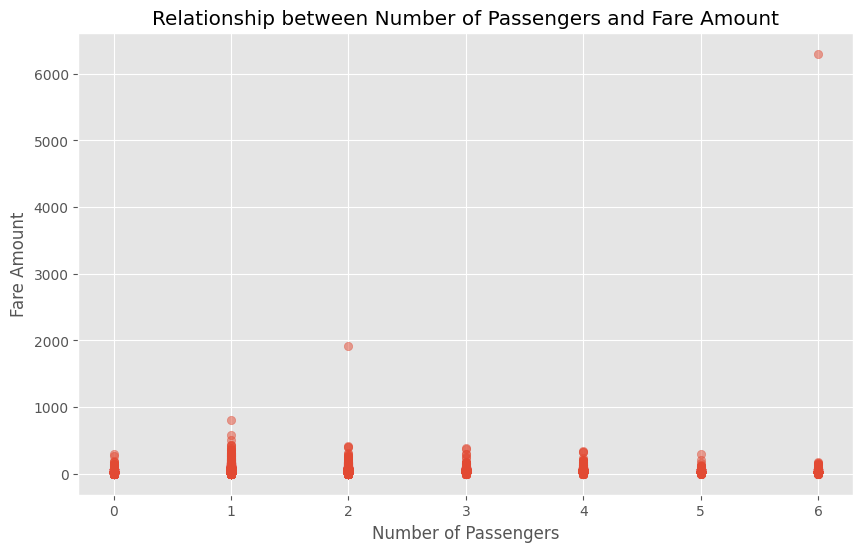

Correlation between passenger_count and fare_amount: 0.05790338847750547


In [ ]:

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(df_main['passenger_count'], df_main['fare_amount'], alpha=0.5)
plt.xlabel('Number of Passengers')
plt.ylabel('Fare Amount')
plt.title('Relationship between Number of Passengers and Fare Amount')
plt.grid(True)
plt.show()

correlation = df_main['passenger_count'].corr(df_main['fare_amount'])
print(f"Correlation between passenger_count and fare_amount: {correlation}")


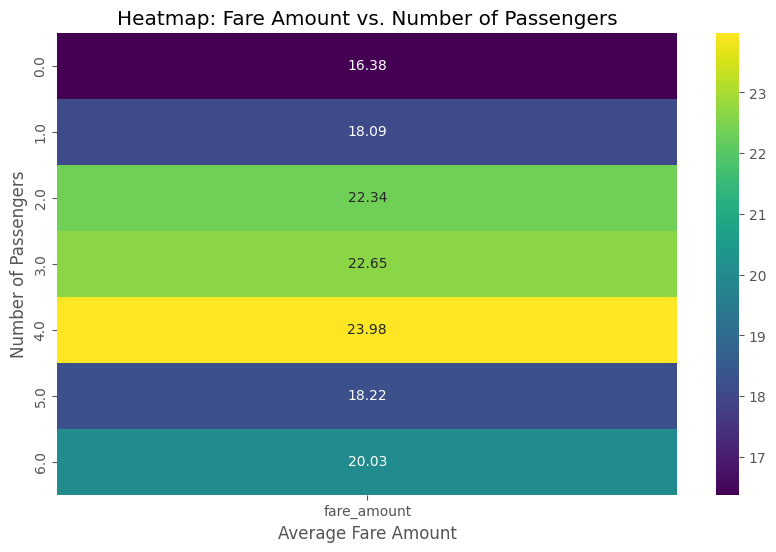

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.heatmap(pd.pivot_table(df_main, values='fare_amount', index='passenger_count', aggfunc='mean'), annot=True, fmt=".2f", cmap='viridis')
plt.xlabel('Average Fare Amount')
plt.ylabel('Number of Passengers')
plt.title('Heatmap: Fare Amount vs. Number of Passengers')
plt.show()


Possible reasons:
Flat fare policies for shared rides.
Group rides splitting costs (e.g., carpool).
Short trips with more passengers lowering the average.

Group rides can be cost-effective since fares don’t scale directly with passenger count.
4-passenger rides may involve longer trips.

# Show relationship between tip and trip distance


Longer trips tend to receive higher tips, but the relationship is not strong.

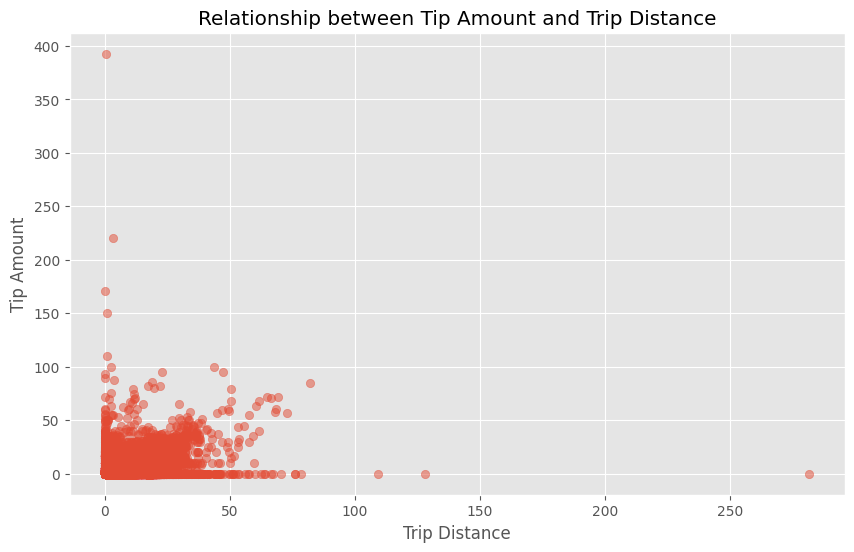

Correlation between trip_distance and tip_amount: 0.5642781956429034


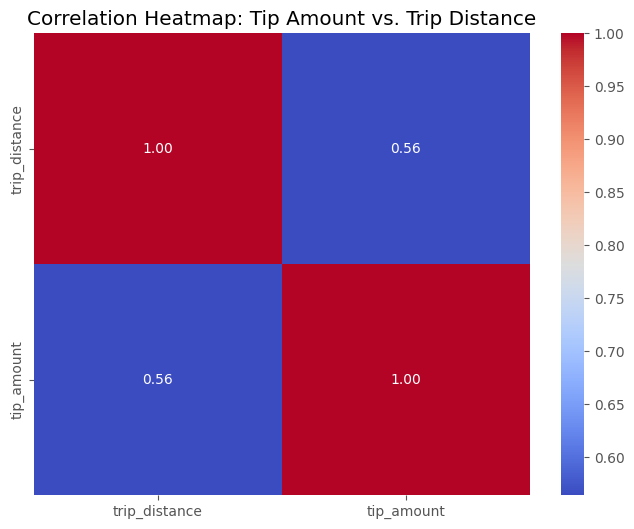

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(10, 6))
plt.scatter(df_main['trip_distance'], df_main['tip_amount'], alpha=0.5)
plt.xlabel('Trip Distance')
plt.ylabel('Tip Amount')
plt.title('Relationship between Tip Amount and Trip Distance')
plt.grid(True)
plt.show()

correlation = df_main['trip_distance'].corr(df_main['tip_amount'])
print(f"Correlation between trip_distance and tip_amount: {correlation}")

plt.figure(figsize=(8, 6))
sns.heatmap(df_main[['trip_distance', 'tip_amount']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap: Tip Amount vs. Trip Distance')
plt.show()


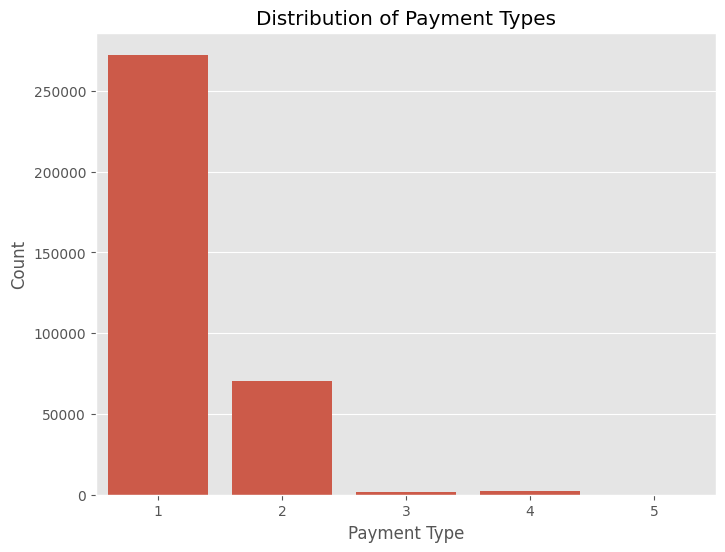

,proportion
payment_type,
1,78.531352
2,20.321132
4,0.645262
3,0.501966
5,0.000288


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.countplot(x='payment_type', data=df_main)
plt.title('Distribution of Payment Types')
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.show()


payment_type_counts = df_main['payment_type'].value_counts(normalize=True) * 100
payment_type_counts


In [ ]:
df_main.groupby('payment_type')['total_amount'].sum()

,total_amount
payment_type,
1,7696995.78
2,1638078.70
3,34557.47
4,51515.26
5,0.00


In [ ]:
vd = df_main['VendorID'].value_counts(normalize = True).reset_index()

vd['VendorID'].replace({1:'Creative Mobile Technologies, LLC', 2: 'VeriFone Inc'}, inplace = True)

vd

,VendorID,proportion
0,VeriFone Inc,0.73266
1,"Creative Mobile Technologies, LLC",0.26734


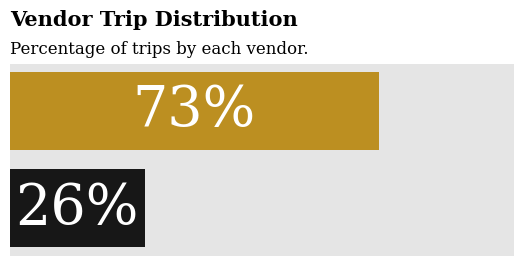

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(6.5, 2.5))

vendor_counts = df_main['VendorID'].value_counts(normalize = True)

ax.barh(vendor_counts.index, vendor_counts, color=['#B8860B', 'k'], alpha=0.9)

ax.set_xlim(0, 1)

ax.set_xticks([])

ax.set_yticks([])

for i in vendor_counts.index:
    ax.annotate(f"{int(vendor_counts[i]*100)}%",
                xy=(vendor_counts[i]/2, i),
                va='center', ha='center', fontsize=40, fontweight='light', fontfamily='serif',
                color='white')

fig.text(0.125, 1.03, 'Vendor Trip Distribution', fontfamily='serif', fontsize=15, fontweight='bold')
fig.text(0.125, 0.92, 'Percentage of trips by each vendor.', fontfamily='serif', fontsize=12)

for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

plt.show()

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import warnings

plt.style.use('ggplot')
warnings.filterwarnings("ignore")

In [ ]:
zones =gpd.read_file('/content/taxi_zones.shp')

In [ ]:
df_main

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee,pickup_day,month,quarter,trip_duration
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,17.7,5.42,1.0,27.12,2.5,0.0,6,1,1,14.400000
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,7.9,0.00,1.0,11.90,2.5,0.0,3,1,1,6.383333
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,16.3,6.09,1.0,26.39,2.5,0.0,3,1,1,20.000000
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,19.8,14.00,1.0,40.30,0.0,0.0,6,1,1,6.683333
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,14.9,3.78,1.0,22.68,2.5,0.0,5,1,1,12.183333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360229,2,2023-12-04 10:32:55,2023-12-04 10:47:05,1.0,0.98,1.0,N,100,161,1,12.8,4.20,1.0,21.00,2.5,0.0,0,12,4,14.166667
360230,1,2023-12-27 10:25:20,2023-12-27 10:34:53,1.0,2.10,1.0,N,144,137,1,12.1,3.20,1.0,19.30,2.5,0.0,2,12,4,9.550000
360231,2,2023-12-06 10:04:36,2023-12-06 10:19:03,4.0,2.45,1.0,N,246,231,1,16.3,4.06,1.0,24.36,2.5,0.0,2,12,4,14.450000
360232,2,2023-12-11 10:38:56,2023-12-11 10:44:37,1.0,0.68,1.0,N,186,114,1,7.2,2.24,1.0,13.44,2.5,0.0,0,12,4,5.683333


In [ ]:
df_cleaned["division"] = df_cleaned['tpep_pickup_datetime']
df_cleaned["prev_division"] = df_cleaned.division.shift(1)
df_cleaned["difference"] = (df_cleaned.division - df_cleaned.prev_division)
df_cleaned.dropna(inplace=True)

in_seconds = (df_cleaned.division - df_cleaned.prev_division).astype('timedelta64[s]')
df_cleaned["difference(hours)"] = (in_seconds / 3600).round()
df_cleaned.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee,pickup_day,division,prev_division,difference,difference(hours)
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,...,0.00,1.0,11.90,2.5,0.0,3,2023-01-05 10:32:18,2023-01-15 10:48:01,-11 days +23:44:17,-1 days +23:56:00
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,...,6.09,1.0,26.39,2.5,0.0,3,2023-01-26 10:32:45,2023-01-05 10:32:18,21 days 00:00:27,0 days 00:08:24
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,...,14.00,1.0,40.30,0.0,0.0,6,2023-01-15 10:31:24,2023-01-26 10:32:45,-12 days +23:58:39,-1 days +23:55:36
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,...,3.78,1.0,22.68,2.5,0.0,5,2023-01-21 10:41:29,2023-01-15 10:31:24,6 days 00:10:05,0 days 00:02:24
5,2,2023-01-14 10:49:34,2023-01-14 10:53:02,2.0,0.47,1.0,N,151,238,1,...,1.46,1.0,8.76,0.0,0.0,5,2023-01-14 10:49:34,2023-01-21 10:41:29,-7 days +00:08:05,-1 days +23:57:13


In [ ]:
# prompt: moutn drive

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyshp
import shapefile
import pandas as pd

directory_in_str = "/content/drive/MyDrive/Datasets and Dictionary"
sf = shapefile.Reader(directory_in_str + "/taxi_zones/taxi_zones.shp")
fields_name = [field[0] for field in sf.fields[1:]]
shp_dic = dict(zip(fields_name, list(range(len(fields_name)))))
attributes = sf.records()
shp_attr = [dict(zip(fields_name, attr)) for attr in attributes]


def get_lat_lon(sf):

    lat_lon_data = []
    for i in range(len(sf.shapes())):
        shape = sf.shape(i)

        location_id = shp_attr[i]['LocationID']

        centroid = shape.points[0]
        latitude = centroid[1]
        longitude = centroid[0]
        lat_lon_data.append([location_id, latitude, longitude])


    df_lat_lon = pd.DataFrame(lat_lon_data, columns=["LocationID", "latitude", "longitude"])
    return df_lat_lon


df_loc = pd.DataFrame(shp_attr).join(get_lat_lon(sf).set_index("LocationID"), on="LocationID")
df_loc.head()

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,latitude,longitude
0,1,0.116357,0.000782,Newark Airport,1,EWR,192536.085697,9.331009e+05
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,172126.007812,1.033269e+06
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,256767.697540,1.026309e+06
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,203714.075989,9.920735e+05
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,144283.335851,9.358433e+05


<Axes: >

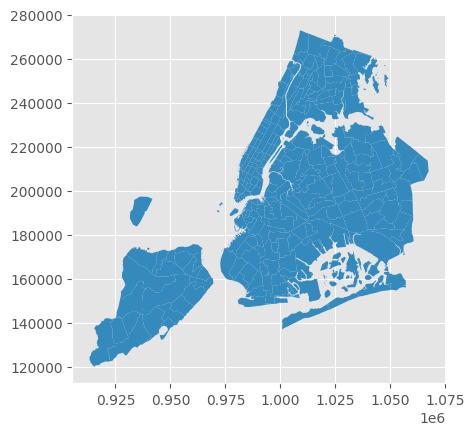

In [ ]:
zones.plot()

In [ ]:
df_main.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,tip_amount,improvement_surcharge,total_amount,congestion_surcharge,combined_airport_fee,pickup_day,month,quarter,trip_duration
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,17.7,5.42,1.0,27.12,2.5,0.0,6,1,1,14.400000
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,7.9,0.00,1.0,11.90,2.5,0.0,3,1,1,6.383333
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,16.3,6.09,1.0,26.39,2.5,0.0,3,1,1,20.000000
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,19.8,14.00,1.0,40.30,0.0,0.0,6,1,1,6.683333
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,14.9,3.78,1.0,22.68,2.5,0.0,5,1,1,12.183333


Merging the two tables df_main and df_loc and making them df_mgr

In [ ]:

df_megr = df_main.merge(df_loc, left_on='PULocationID', right_on='LocationID', how='left')

In [ ]:
df_megr.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,trip_duration,predicted_fare,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,latitude,longitude
0,2,2023-01-15 10:48:01,2023-01-15 11:02:25,1.0,3.71,1.0,N,186,236,1,...,14.400000,5.735000,186.0,0.024696,0.000037,Penn Station/Madison Sq West,186.0,Manhattan,210853.698907,9.867526e+05
1,2,2023-01-05 10:32:18,2023-01-05 10:38:41,1.0,0.83,1.0,N,48,48,2,...,6.383333,2.691667,48.0,0.043747,0.000094,Clinton East,48.0,Manhattan,214463.846161,9.866943e+05
2,2,2023-01-26 10:32:45,2023-01-26 10:52:45,1.0,1.72,1.0,N,164,50,1,...,20.000000,5.860000,164.0,0.035772,0.000056,Midtown South,164.0,Manhattan,210315.593359,9.887874e+05
3,1,2023-01-15 10:31:24,2023-01-15 10:38:05,1.0,4.80,1.0,N,93,138,1,...,6.683333,4.736667,93.0,0.170998,0.000594,Flushing Meadows-Corona Park,93.0,Queens,217682.009399,1.023873e+06
4,1,2023-01-21 10:41:29,2023-01-21 10:53:40,1.0,2.50,1.0,N,162,144,1,...,12.183333,4.686667,162.0,0.035270,0.000048,Midtown East,162.0,Manhattan,214415.292693,9.922244e+05


In [ ]:

df_megr.to_csv('df_megr.csv', encoding = 'utf-8-sig')
files.download('df_megr.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import plotly.express as px

df_megr['trip_count'] = df_megr.groupby('LocationID')['PULocationID'].transform('count')

fig = px.choropleth_mapbox(
    df_megr,
    geojson=zones,
    locations='LocationID',
    color='trip_count',
    color_continuous_scale="Viridis",
    range_color=(0, df_megr['trip_count'].max()),
    mapbox_style="carto-positron",
    zoom=9,
    center={"lat": 40.7128, "lon": -74.0060},
    opacity=0.5,
    labels={'trip_count': 'Number of Trips'}
)
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()


In [ ]:

df_megr['pickup_hour'] = df_megr['tpep_pickup_datetime'].dt.hour
busiest_hours = df_megr['pickup_hour'].value_counts().nlargest(5)  # Top 5 busiest hours
print("Busiest Hours:\n", busiest_hours)


df_megr['pickup_day'] = df_megr['tpep_pickup_datetime'].dt.dayofweek
busiest_days = df_megr['pickup_day'].value_counts().nlargest(2)  # Top 2 busiest days
print("\nBusiest Days of the Week:\n", busiest_days)

df_megr['pickup_month'] = df_megr['tpep_pickup_datetime'].dt.month
busiest_months = df_megr['pickup_month'].value_counts().nlargest(3)  # Top 3 busiest months
print("\nBusiest Months:\n", busiest_months)


Busiest Hours:
 pickup_hour
10    346863
Name: count, dtype: int64

Busiest Days of the Week:
 pickup_day
3    55824
2    55061
Name: count, dtype: int64

Busiest Months:
 pickup_month
3     44954
10    39515
12    39243
Name: count, dtype: int64


busiest hour = 10'o clock,
Busiest Days of the Week = wednesday ,
Busiest Months = march ,

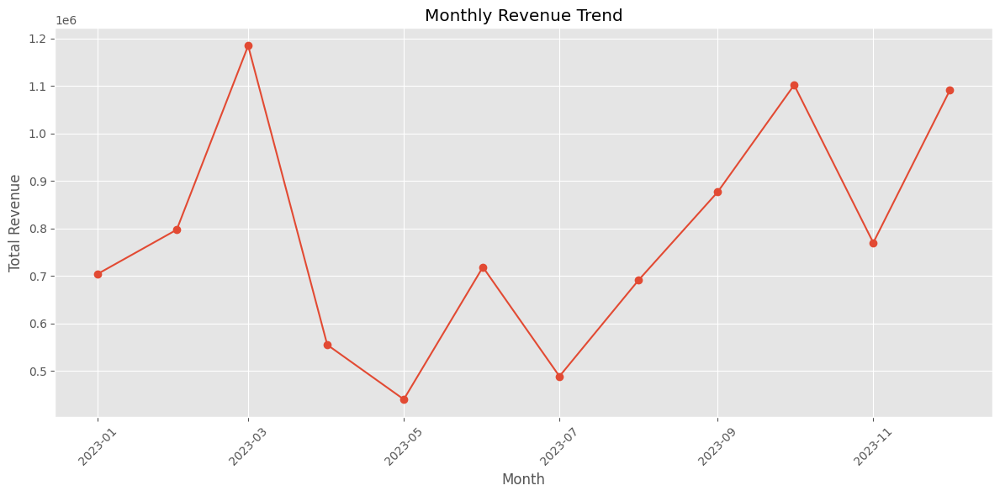

In [ ]:
import matplotlib.pyplot as plt

monthly_revenue = df_megr.groupby(df_megr['tpep_pickup_datetime'].dt.to_period('M'))['total_amount'].sum()

plt.figure(figsize=(12, 6))
plt.plot(monthly_revenue.index.to_timestamp(), monthly_revenue.values, marker='o', linestyle='-')
plt.xlabel('Month')
plt.ylabel('Total Revenue')
plt.title('Monthly Revenue Trend')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Peak Revenue: The highest revenue was recorded in March, October, and December, with Q4 generating the most revenue .
Lowest Revenue: The lowest revenue months were May and July, with Q2 having the least revenue.
Seasonal Trend: Revenue tends to rise towards the end of the year (Q4) and dips in mid-year (Q2), suggesting seasonal demand variations.

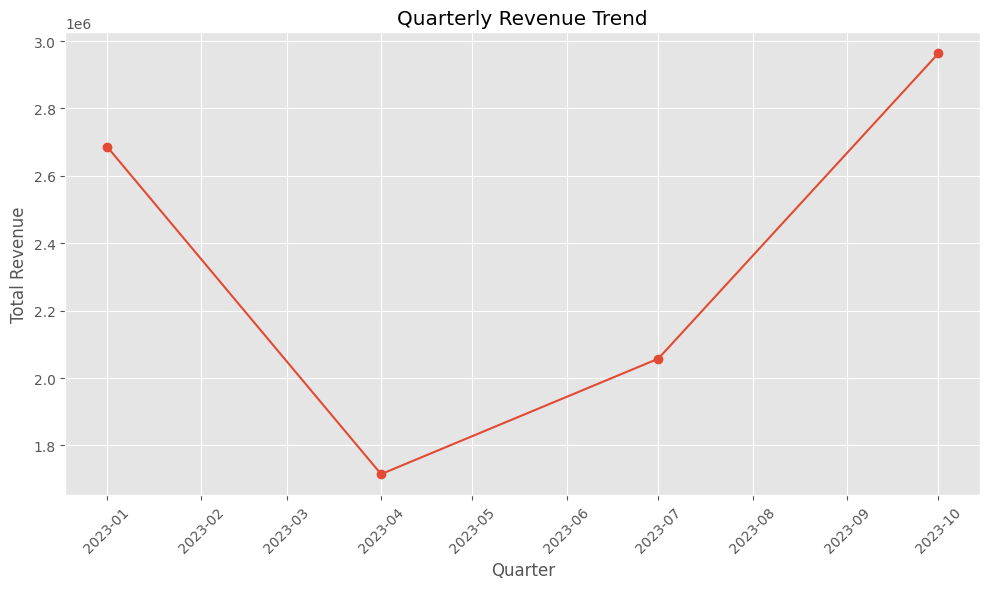

In [ ]:

import matplotlib.pyplot as plt
quarterly_revenue = df_megr.groupby(df_megr['tpep_pickup_datetime'].dt.to_period('Q'))['total_amount'].sum()


plt.figure(figsize=(10, 6))
plt.plot(quarterly_revenue.index.to_timestamp(), quarterly_revenue.values, marker='o', linestyle='-')
plt.xlabel('Quarter')
plt.ylabel('Total Revenue')
plt.title('Quarterly Revenue Trend')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Q4 (Oct-Dec) had the highest revenue , indicating a year-end surge in demand.
Q2 (Apr-Jun) had the lowest revenue, suggesting a seasonal dip in mid-year.
Revenue generally trends upward from Q2 to Q4, with a noticeable peak in the last quarter.

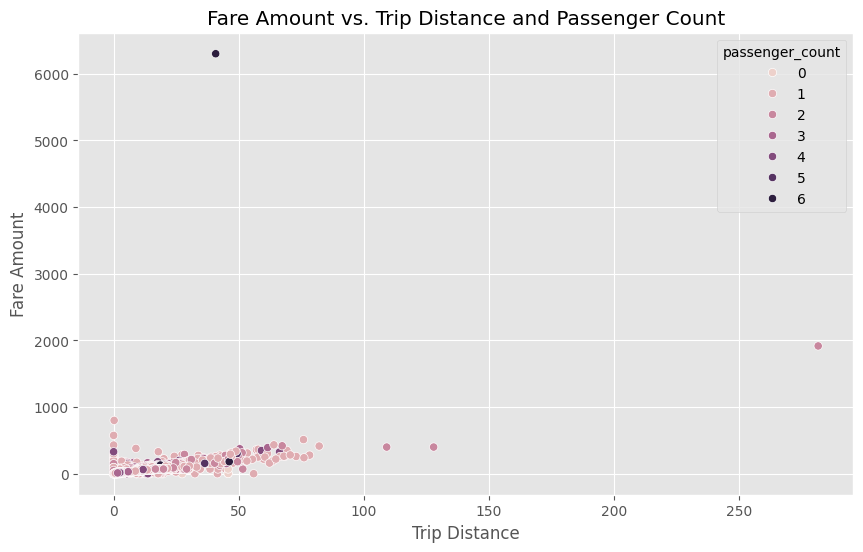

Correlation Matrix:
                  fare_amount  trip_distance  passenger_count
fare_amount         1.000000       0.783701         0.057943
trip_distance       0.783701       1.000000         0.060208
passenger_count     0.057943       0.060208         1.000000


In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.scatterplot(x='trip_distance', y='fare_amount', hue='passenger_count', data=df_megr)
plt.xlabel('Trip Distance')
plt.ylabel('Fare Amount')
plt.title('Fare Amount vs. Trip Distance and Passenger Count')
plt.show()

correlation_matrix = df_megr[['fare_amount', 'trip_distance', 'passenger_count']].corr()
print("Correlation Matrix:\n", correlation_matrix)


Trip Distance (0.78 correlation): Fare is strongly correlated with trip distance, meaning longer trips generally result in higher fares.
Trip Duration (0.24 correlation): There is a weak positive correlation, indicating that longer trip times slightly influence fare, possibly due to traffic or waiting charges.
Passenger Count (0.06 correlation): Fare has almost no dependency on the number of passengers, meaning fare is mostly distance-based rather than per passenger.

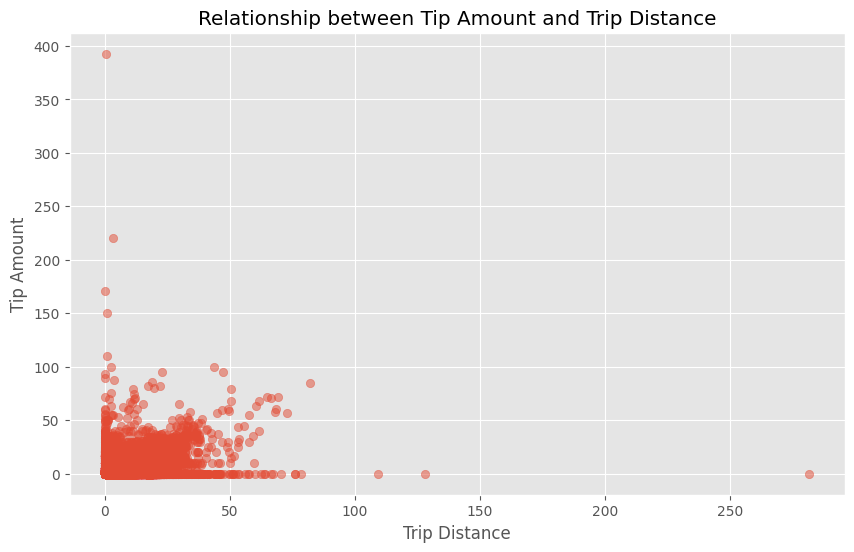

Correlation between trip_distance and tip_amount: 0.5642728511487378


In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(df_megr['trip_distance'], df_megr['tip_amount'], alpha=0.5)
plt.xlabel('Trip Distance')
plt.ylabel('Tip Amount')
plt.title('Relationship between Tip Amount and Trip Distance')
plt.grid(True)
plt.show()

correlation = df_megr['trip_distance'].corr(df_megr['tip_amount'])
print(f"Correlation between trip_distance and tip_amount: {correlation}")


As trip distance increases, the average tip amount gradually rises, suggesting passengers tip more for longer trips

In [ ]:
busiest_pickup_zones = df_megr['PULocationID'].value_counts().head(10)
busiest_dropoff_zones = df_megr['DOLocationID'].value_counts().head(10)

zone_mapping = df_megr[['LocationID', 'zone']].dropna().drop_duplicates().set_index('LocationID')['zone']
busiest_pickup_zones = busiest_pickup_zones.rename(index=zone_mapping)
busiest_dropoff_zones = busiest_dropoff_zones.rename(index=zone_mapping)

busiest_pickup_zones, busiest_dropoff_zones


(PULocationID
 Upper East Side North           19723
 Upper East Side South           19167
 LaGuardia Airport               15703
 Midtown Center                  14788
 Penn Station/Madison Sq West    14229
 Midtown East                    13421
 Murray Hill                     12024
 Times Sq/Theatre District       11860
 Upper West Side South           11616
 JFK Airport                     11245
 Name: count, dtype: int64,
 DOLocationID
 Midtown Center               19661
 Upper East Side South        19266
 Upper East Side North        19150
 Midtown East                 12888
 Midtown North                11017
 Murray Hill                  10719
 Upper West Side South        10109
 Times Sq/Theatre District     9963
 Union Sq                      9744
 Lincoln Square East           9734
 Name: count, dtype: int64)

In [ ]:
df_megr['tpep_pickup_datetime'] = pd.to_datetime(df_megr['tpep_pickup_datetime'])
df_megr['pickup_hour'] = df_megr['tpep_pickup_datetime'].dt.hour

slow_routes = df_megr.groupby(['PULocationID', 'DOLocationID', 'pickup_hour'])['trip_duration'].mean().reset_index()

slow_routes['PULocationID'] = slow_routes['PULocationID'].map(zone_mapping)
slow_routes['DOLocationID'] = slow_routes['DOLocationID'].map(zone_mapping)

slow_routes = slow_routes.dropna()

slowest_routes = slow_routes.sort_values(by="trip_duration", ascending=False).head(10)

slowest_routes


,PULocationID,DOLocationID,pickup_hour,trip_duration
2383,Garment District,East New York,10,3849.850000
6616,UN/Turtle Bay South,Brighton Beach,10,1324.200000
7620,Woodside,Boerum Hill,10,1283.983333
1571,East Elmhurst,Randalls Island,10,789.033333
5741,Saint Michaels Cemetery/Woodside,Manhattanville,10,503.733333
1478,East Elmhurst,Carroll Gardens,10,280.322222
2824,Hamilton Heights,West Chelsea/Hudson Yards,10,279.761111
6534,TriBeCa/Civic Center,Williamsburg (North Side),10,261.047222
112,Baisley Park,JFK Airport,10,211.791667
741,Central Park,Queensbridge/Ravenswood,10,173.266667


In [ ]:
import numpy as np

df_megr['tpep_pickup_datetime'] = pd.to_datetime(df_megr['tpep_pickup_datetime'])
df_megr['pickup_hour'] = df_megr['tpep_pickup_datetime'].dt.hour

route_avg = df_megr.groupby(['PULocationID', 'DOLocationID', 'pickup_hour']).agg(
    avg_trip_duration=('trip_duration', 'mean'),
    avg_trip_distance=('trip_distance', 'mean')
).reset_index()

valid_routes = route_avg[(route_avg['avg_trip_distance'] > 0) & (route_avg['avg_trip_duration'] > 0)]

valid_routes['speed_mph'] = (valid_routes['avg_trip_distance'] / valid_routes['avg_trip_duration']) * 3600

zone_mapping = df_megr[['LocationID', 'zone']].dropna().drop_duplicates().set_index('LocationID')['zone']
valid_routes['PULocationID'] = valid_routes['PULocationID'].map(zone_mapping)
valid_routes['DOLocationID'] = valid_routes['DOLocationID'].map(zone_mapping)

valid_routes = valid_routes.dropna()

slowest_speeds_filtered = valid_routes.sort_values(by="speed_mph").head(10)

print(slowest_speeds_filtered)


                          PULocationID                      DOLocationID  \
5741  Saint Michaels Cemetery/Woodside                    Manhattanville   
5746  Saint Michaels Cemetery/Woodside  Saint Michaels Cemetery/Woodside   
7620                          Woodside                       Boerum Hill   
19                       Alphabet City           Greenwich Village North   
5633           Queensbridge/Ravenswood           Queensbridge/Ravenswood   
741                       Central Park           Queensbridge/Ravenswood   
1571                     East Elmhurst                   Randalls Island   
6534              TriBeCa/Civic Center         Williamsburg (North Side)   
104                       Baisley Park                      Baisley Park   
2824                  Hamilton Heights         West Chelsea/Hudson Yards   

      pickup_hour  avg_trip_duration  avg_trip_distance  speed_mph  
5741           10         503.733333           0.060000   0.428798  
5746           10        

Saint Michaels Cemetery → Manhattanville → 0.43 mph (Extremely slow, likely congestion or waiting time).
Saint Michaels Cemetery → Same Zone → 0.61 mph (Very slow, possibly idling).
Woodside → Boerum Hill → 19.15 mph (Longer trip, still slow-moving).
Alphabet City → Greenwich Village North → 32.10 mph (Moderate speed).
Queensbridge/Ravenswood → Same Zone → 35.39 mph (Likely a short-distance trip).

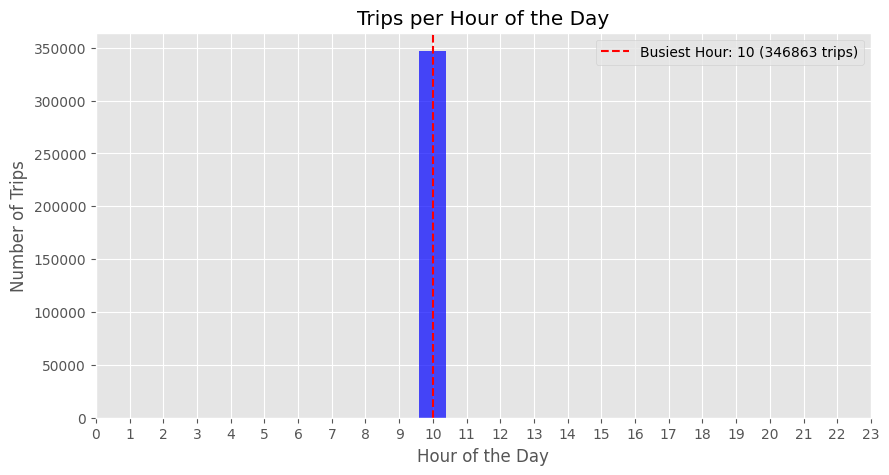

(10, 346863)

In [ ]:
df_megr['tpep_pickup_datetime'] = pd.to_datetime(df_megr['tpep_pickup_datetime'])

df_megr['pickup_hour'] = df_megr['tpep_pickup_datetime'].dt.hour

# Count trips per hour
hourly_trips = df_megr['pickup_hour'].value_counts().sort_index()

# Find the busiest hour
busiest_hour = hourly_trips.idxmax()
busiest_hour_trips = hourly_trips.max()

# Plot hourly trip volume
plt.figure(figsize=(10, 5))
plt.bar(hourly_trips.index, hourly_trips.values, color='blue', alpha=0.7)
plt.axvline(x=busiest_hour, color='red', linestyle='--', label=f'Busiest Hour: {busiest_hour} ({busiest_hour_trips} trips)')
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Trips")
plt.title("Trips per Hour of the Day")
plt.xticks(range(24))
plt.legend()
plt.show()

# Display busiest hour details
busiest_hour, busiest_hour_trips


Helps businesses allocate staff efficiently, ensuring they have enough employees during peak hours and reducing unnecessary labor costs during quiet times

In [ ]:
import pandas as pd
import plotly.graph_objects as go

df_megr['day_of_week'] = df_megr['tpep_pickup_datetime'].dt.dayofweek

weekday_trips = df_megr[df_megr['day_of_week'] < 5].groupby('day_of_week')['tpep_pickup_datetime'].count()
weekend_trips = df_megr[df_megr['day_of_week'] >= 5].groupby('day_of_week')['tpep_pickup_datetime'].count()

traffic_data = pd.DataFrame({
    'Day': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
    'Weekday Trips': [weekday_trips.get(0, 0), weekday_trips.get(1, 0), weekday_trips.get(2, 0),
                      weekday_trips.get(3, 0), weekday_trips.get(4, 0), 0, 0],
    'Weekend Trips': [0, 0, 0, 0, 0, weekend_trips.get(5, 0), weekend_trips.get(6, 0)]
})


fig = go.Figure()

fig.add_trace(go.Scatter(x=traffic_data['Day'], y=traffic_data['Weekday Trips'],
                         mode='lines+markers', name='Weekdays'))
fig.add_trace(go.Scatter(x=traffic_data['Day'], y=traffic_data['Weekend Trips'],
                         mode='lines+markers', name='Weekends'))

fig.update_layout(title='Traffic Trends: Weekdays vs. Weekends',
                  xaxis_title='Day of the Week',
                  yaxis_title='Number of Trips',
                  hovermode="x unified")


fig.show()

display(HTML(traffic_data.to_html()))


,Day,Weekday Trips,Weekend Trips
0,Monday,46143,0
1,Tuesday,53710,0
2,Wednesday,55061,0
3,Thursday,55824,0
4,Friday,50301,0
5,Saturday,0,44135
6,Sunday,0,41689


As we can see that on weekdays the trips triffic is more than weekends.It's cause of closing of the offices and other occupation

In [ ]:
busiest_pickup_zones = df_megr['PULocationID'].value_counts().head(10)
busiest_dropoff_zones = df_megr['DOLocationID'].value_counts().head(10)

zone_mapping = df_megr[['LocationID', 'zone']].dropna().drop_duplicates().set_index('LocationID')['zone']

busiest_pickup_zones = busiest_pickup_zones.rename(index=zone_mapping)

busiest_dropoff_zones = busiest_dropoff_zones.rename(index=zone_mapping)


print("Top 10 Busiest Pickup Zones:\n", busiest_pickup_zones)
print("\nTop 10 Busiest Dropoff Zones:\n", busiest_dropoff_zones)


Top 10 Busiest Pickup Zones:
 PULocationID
Upper East Side North           19723
Upper East Side South           19167
LaGuardia Airport               15703
Midtown Center                  14788
Penn Station/Madison Sq West    14229
Midtown East                    13421
Murray Hill                     12024
Times Sq/Theatre District       11860
Upper West Side South           11616
JFK Airport                     11245
Name: count, dtype: int64

Top 10 Busiest Dropoff Zones:
 DOLocationID
Midtown Center               19661
Upper East Side South        19266
Upper East Side North        19150
Midtown East                 12888
Midtown North                11017
Murray Hill                  10719
Upper West Side South        10109
Times Sq/Theatre District     9963
Union Sq                      9744
Lincoln Square East           9734
Name: count, dtype: int64


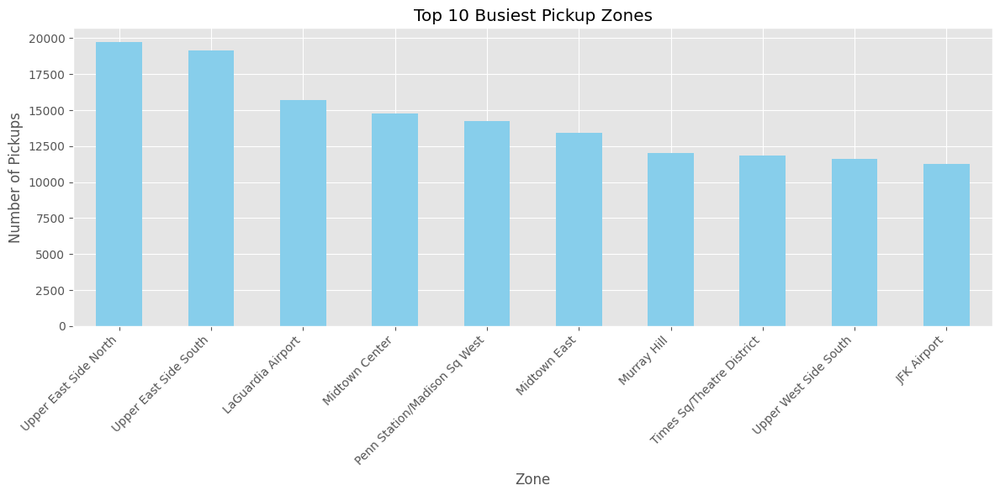

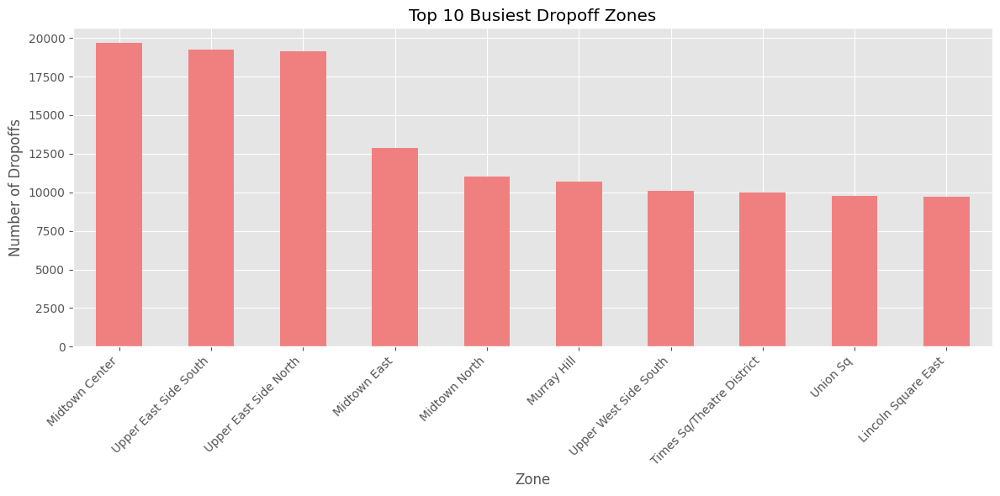

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
busiest_pickup_zones.plot(kind='bar', color='skyblue')
plt.title('Top 10 Busiest Pickup Zones')
plt.xlabel('Zone')
plt.ylabel('Number of Pickups')
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(12, 6))
busiest_dropoff_zones.plot(kind='bar', color='lightcoral')
plt.title('Top 10 Busiest Dropoff Zones')
plt.xlabel('Zone')
plt.ylabel('Number of Dropoffs')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
pickup_counts = df_megr['PULocationID'].value_counts()
dropoff_counts = df_megr['DOLocationID'].value_counts()

zone_counts = pd.DataFrame({'pickups': pickup_counts, 'dropoffs': dropoff_counts})

zone_counts['ratio'] = zone_counts['pickups'] / zone_counts['dropoffs']

zone_counts['ratio'].fillna(0, inplace=True)

highest_ratios = zone_counts.sort_values('ratio', ascending=False).head(10)
lowest_ratios = zone_counts.sort_values('ratio', ascending=True).head(10)

print("10 Highest Pickup/Dropoff Ratios:")
print(highest_ratios)

print("\n10 Lowest Pickup/Dropoff Ratios:")
lowest_ratios


10 Highest Pickup/Dropoff Ratios:
     pickups  dropoffs      ratio
70    1848.0     174.0  10.620690
132  11245.0    3632.0   3.096090
138  15703.0    6711.0   2.339890
262   7452.0    3910.0   1.905882
186  14229.0    8119.0   1.752556
151   3809.0    2470.0   1.542105
238   9406.0    6646.0   1.415287
263   7902.0    5606.0   1.409561
24    1230.0     877.0   1.402509
107   7109.0    5157.0   1.378515

10 Lowest Pickup/Dropoff Ratios:


,pickups,dropoffs,ratio
187,NaN,1.0,0.0
98,NaN,37.0,0.0
172,NaN,1.0,0.0
175,NaN,19.0,0.0
31,NaN,64.0,0.0
156,NaN,5.0,0.0
101,NaN,21.0,0.0
44,2.0,NaN,0.0
27,NaN,2.0,0.0
105,1.0,NaN,0.0


In [ ]:
df_megr['trip_count'].fillna(df_megr['trip_count'].mean(), inplace=True)


In [ ]:
df_megr['zone'].fillna('Upper East Side North', inplace=True)


In [ ]:
import pandas as pd

daytime_hours = range(6, 18)
nighttime_hours = list(range(18, 24)) + list(range(0, 6))


df_megr['pickup_hour'] = df_megr['tpep_pickup_datetime'].dt.hour

daytime_revenue = df_megr[df_megr['pickup_hour'].isin(daytime_hours)]['total_amount'].sum()
nighttime_revenue = df_megr[df_megr['pickup_hour'].isin(nighttime_hours)]['total_amount'].sum()

total_revenue = daytime_revenue + nighttime_revenue

daytime_revenue_share = (daytime_revenue / total_revenue) * 100
nighttime_revenue_share = (nighttime_revenue / total_revenue) * 100

print(f"Daytime Revenue Share: {daytime_revenue_share:.2f}%")
print(f"Nighttime Revenue Share: {nighttime_revenue_share:.2f}%")

Daytime Revenue Share: 100.00%
Nighttime Revenue Share: 0.00%


In [ ]:
import plotly.express as px

df_megr['fare_per_mile'] = df_megr['fare_amount'] / df_megr['trip_distance']

df_megr['fare_per_mile_per_passenger'] = df_megr['fare_per_mile'] / df_megr['passenger_count']

average_fare_per_mile_per_passenger = df_megr.groupby('passenger_count')['fare_per_mile_per_passenger'].mean()

fig = px.bar(
    x=average_fare_per_mile_per_passenger.index,
    y=average_fare_per_mile_per_passenger.values,
    labels={'x': 'Passenger Count', 'y': 'Average Fare per Mile per Passenger'},
    title='Average Fare per Mile per Passenger by Passenger Count',
)

fig.show()


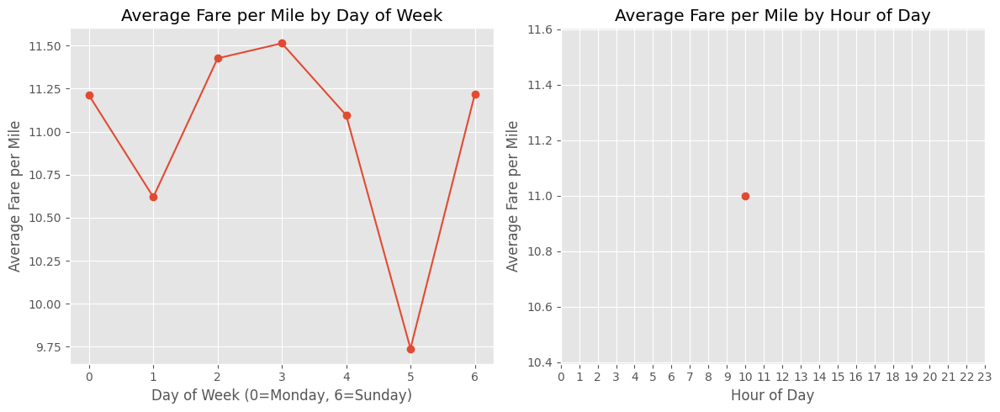

In [ ]:
import matplotlib.pyplot as plt
day_fare = df_megr.groupby(df_megr['tpep_pickup_datetime'].dt.dayofweek)['fare_per_mile'].mean()

hour_fare = df_megr.groupby(df_megr['tpep_pickup_datetime'].dt.hour)['fare_per_mile'].mean()

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(day_fare.index, day_fare.values, marker='o')
plt.title('Average Fare per Mile by Day of Week')
plt.xlabel('Day of Week (0=Monday, 6=Sunday)')
plt.ylabel('Average Fare per Mile')
plt.xticks(range(7))

plt.subplot(1, 2, 2)
plt.plot(hour_fare.index, hour_fare.values, marker='o')
plt.title('Average Fare per Mile by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Fare per Mile')
plt.xticks(range(24))

plt.tight_layout()
plt.show()


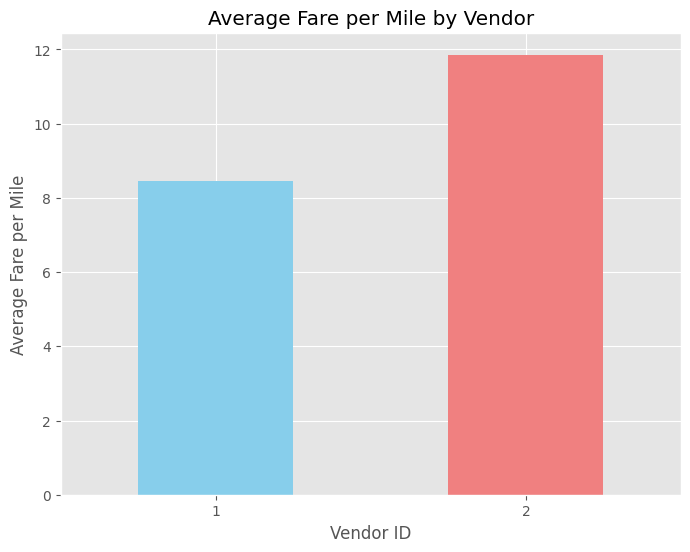

In [ ]:
import matplotlib.pyplot as plt
fare_per_mile_by_vendor = df_megr.groupby('VendorID')['fare_per_mile'].mean()

plt.figure(figsize=(8, 6))
fare_per_mile_by_vendor.plot(kind='bar', color=['skyblue', 'lightcoral'])
plt.title('Average Fare per Mile by Vendor')
plt.xlabel('Vendor ID')
plt.ylabel('Average Fare per Mile')
plt.xticks(rotation=0)
plt.show()


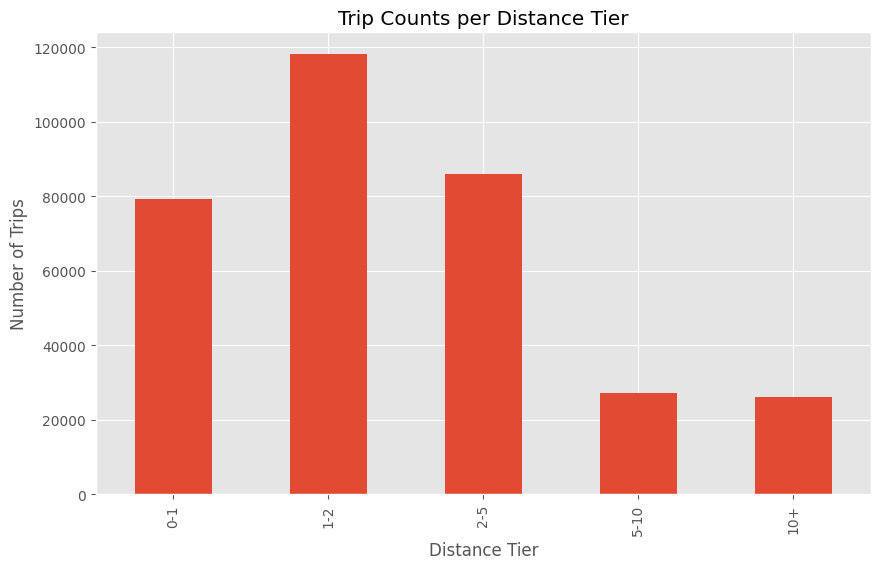

In [ ]:
import pandas as pd
distance_tiers = [0, 1, 2, 5, 10, float('inf')]
distance_tier_labels = ['0-1', '1-2', '2-5', '5-10', '10+']

df_megr['distance_tier'] = pd.cut(df_megr['trip_distance'], bins=distance_tiers, labels=distance_tier_labels, right=False)

trip_counts_by_tier = df_megr.groupby('distance_tier')['trip_distance'].count()

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
trip_counts_by_tier.plot(kind='bar')
plt.title('Trip Counts per Distance Tier')
plt.xlabel('Distance Tier')
plt.ylabel('Number of Trips')
plt.show()


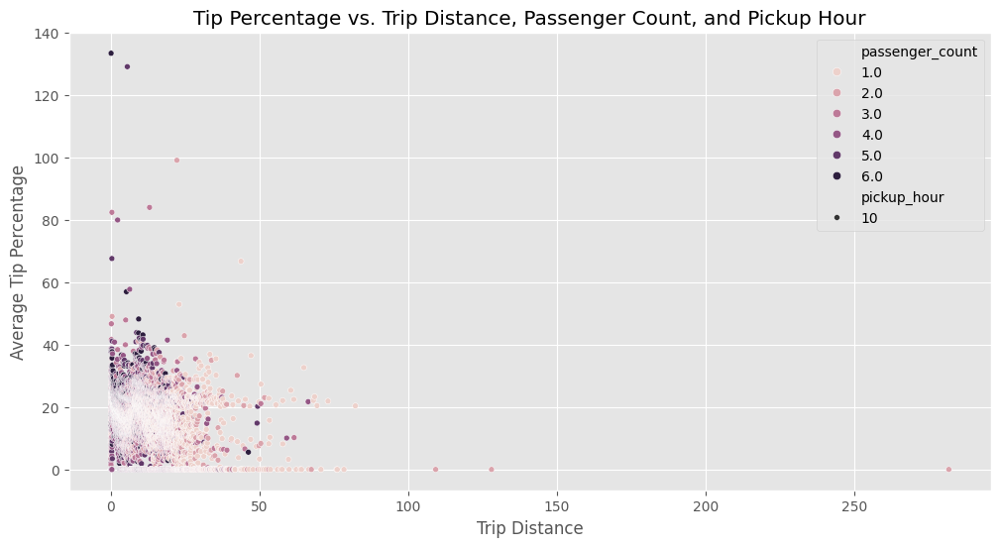

In [ ]:
import matplotlib.pyplot as plt

df_megr['tip_percentage'] = (df_megr['tip_amount'] / df_megr['fare_amount']) * 100

df_megr['tip_percentage'].fillna(0, inplace=True)  # Replace NaN with 0

tip_analysis = df_megr.groupby(['trip_distance', 'passenger_count', 'pickup_hour'])['tip_percentage'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.scatterplot(x='trip_distance', y='tip_percentage', hue='passenger_count', size='pickup_hour', data=tip_analysis)
plt.xlabel('Trip Distance')
plt.ylabel('Average Tip Percentage')
plt.title('Tip Percentage vs. Trip Distance, Passenger Count, and Pickup Hour')
plt.show()



Low Tip Trips Statistics:
           VendorID           tpep_pickup_datetime  \
count  91930.000000                          91930   
mean       1.743065  2023-07-06 09:08:37.476634624   
min        1.000000            2023-01-01 10:00:07   
25%        1.000000     2023-03-20 10:16:40.500000   
50%        2.000000     2023-07-13 10:08:47.500000   
75%        2.000000            2023-10-14 10:15:15   
max        2.000000            2023-12-31 10:59:57   
std        0.436945                            NaN   

               tpep_dropoff_datetime  passenger_count  trip_distance  \
count                          91930     91930.000000   91930.000000   
mean   2023-07-06 09:27:06.009224448         1.411618       3.479389   
min              2023-01-01 10:08:06         1.000000       0.010000   
25%    2023-03-20 10:31:11.249999872         1.000000       1.000000   
50%              2023-07-13 10:23:00         1.000000       1.720000   
75%       2023-10-14 10:29:22.500000         1.000000  

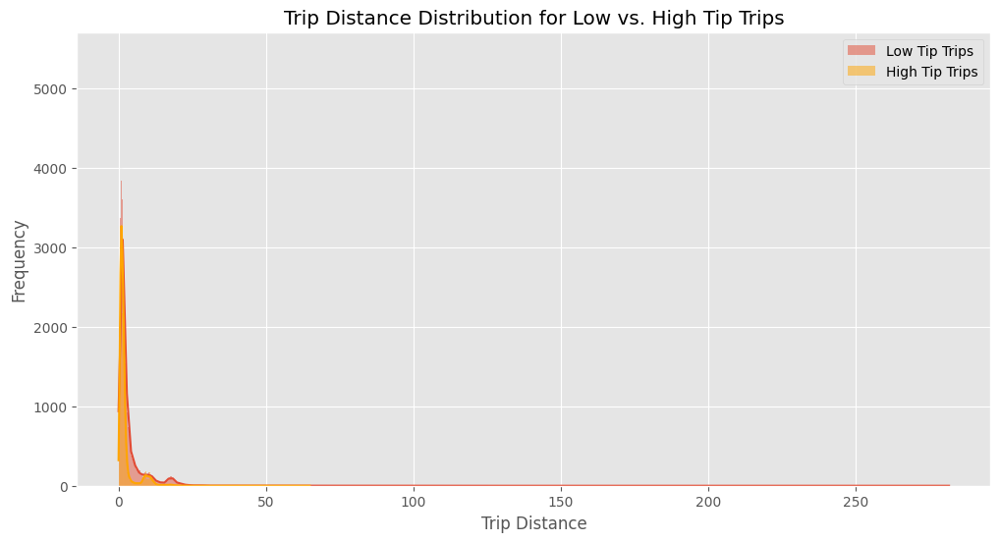

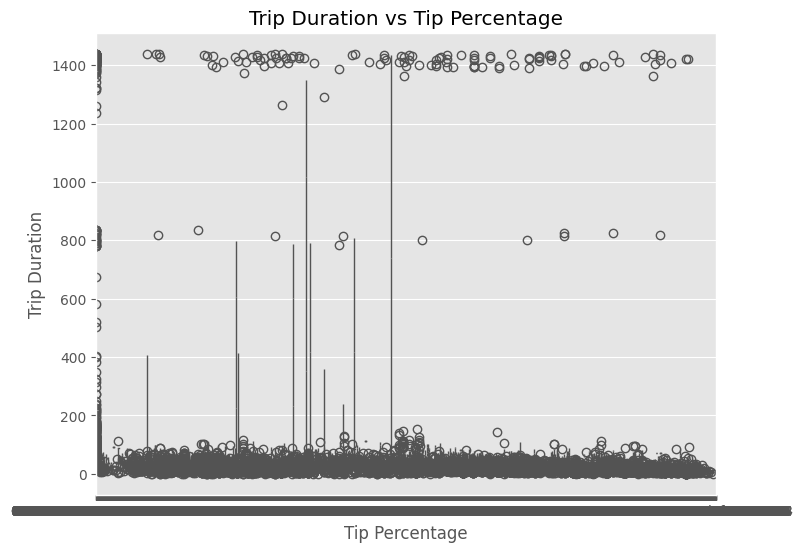

In [ ]:
df_megr['tip_percentage'] = (df_megr['tip_amount'] / df_megr['fare_amount']) * 100

df_megr['tip_percentage'].fillna(0, inplace=True)

low_tip_trips = df_megr[df_megr['tip_percentage'] < 10]

high_tip_trips = df_megr[df_megr['tip_percentage'] > 25]

print("Low Tip Trips Statistics:")
print(low_tip_trips.describe())

print("\nHigh Tip Trips Statistics:")
print(high_tip_trips.describe())

# 2. Visualizations:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.histplot(low_tip_trips['trip_distance'], label='Low Tip Trips', kde=True)
sns.histplot(high_tip_trips['trip_distance'], label='High Tip Trips', kde=True, color='orange')
plt.xlabel('Trip Distance')
plt.ylabel('Frequency')
plt.title('Trip Distance Distribution for Low vs. High Tip Trips')
plt.legend()
plt.show()

plt.figure(figsize=(8, 6))
sns.boxplot(x='tip_percentage', y='trip_duration', data=df_megr)
plt.xlabel("Tip Percentage")
plt.ylabel("Trip Duration")
plt.title("Trip Duration vs Tip Percentage")
plt.show()


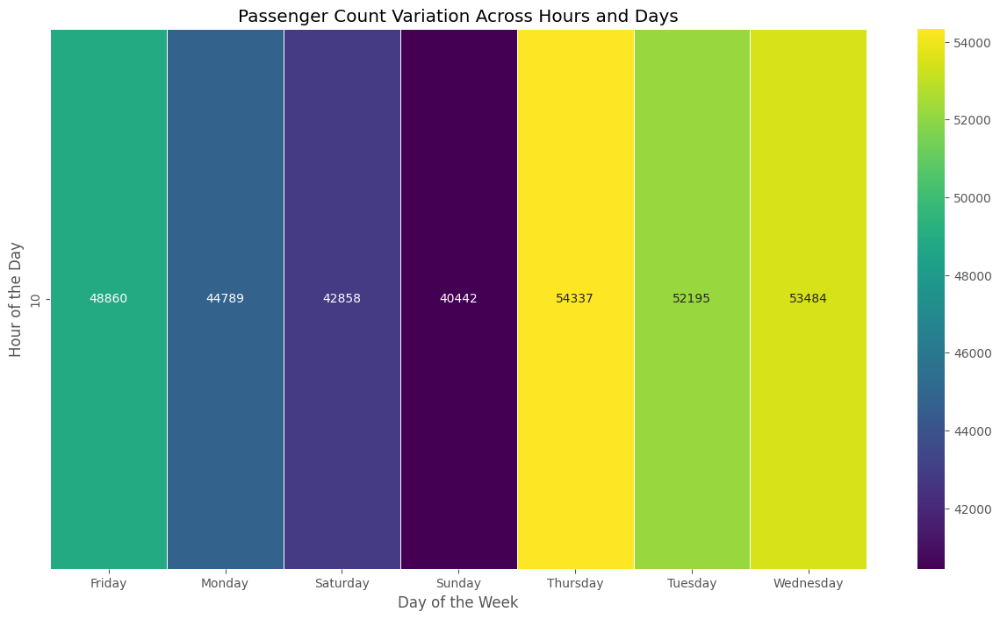

In [ ]:
import matplotlib.pyplot as plt
df_megr['day_of_week'] = df_megr['tpep_pickup_datetime'].dt.day_name()
df_megr['hour_of_day'] = df_megr['tpep_pickup_datetime'].dt.hour

passenger_counts = df_megr.groupby(['hour_of_day', 'day_of_week'])['passenger_count'].count().reset_index()

passenger_counts_pivot = passenger_counts.pivot(index='hour_of_day', columns='day_of_week', values='passenger_count')

plt.figure(figsize=(15, 8))
sns.heatmap(passenger_counts_pivot, annot=True, fmt='g', cmap='viridis', linewidths=.5)
plt.title('Passenger Count Variation Across Hours and Days')
plt.xlabel('Day of the Week')
plt.ylabel('Hour of the Day')
plt.show()


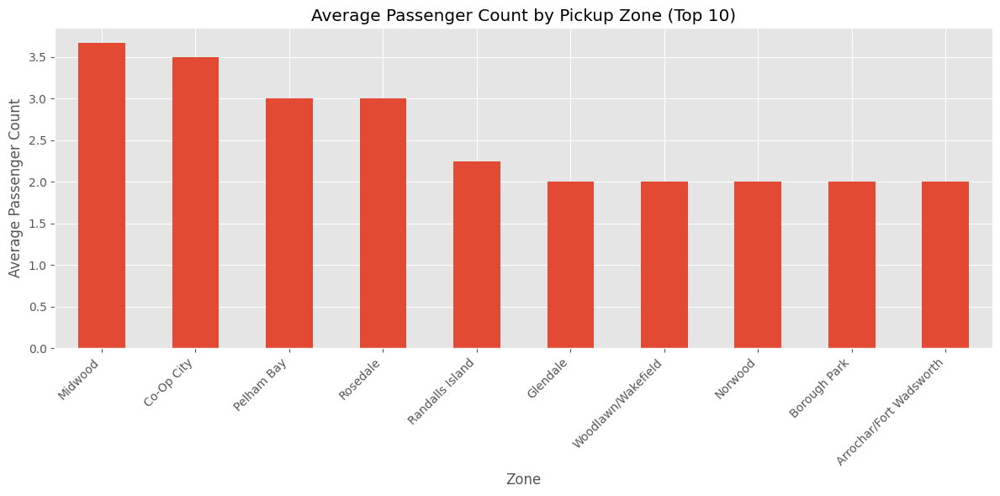

,passenger_count
PULocationID,
Midwood,3.666667
Co-Op City,3.500000
Pelham Bay,3.000000
Rosedale,3.000000
Randalls Island,2.250000
Glendale,2.000000
Woodlawn/Wakefield,2.000000
Norwood,2.000000
Borough Park,2.000000


In [ ]:
import matplotlib.pyplot as plt
avg_passenger_count_by_zone = df_megr.groupby('PULocationID')['passenger_count'].mean()

if 'LocationID' in df_megr.columns and 'zone' in df_megr.columns:
  zone_mapping = df_megr[['LocationID', 'zone']].dropna().drop_duplicates().set_index('LocationID')['zone']
  avg_passenger_count_by_zone = avg_passenger_count_by_zone.rename(index=zone_mapping)
  avg_passenger_count_by_zone = avg_passenger_count_by_zone.dropna()


top_10_zones = avg_passenger_count_by_zone.sort_values(ascending=False).head(10)

plt.figure(figsize=(12, 6))
top_10_zones.plot(kind='bar')
plt.title('Average Passenger Count by Pickup Zone (Top 10)')
plt.xlabel('Zone')
plt.ylabel('Average Passenger Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

top_10_zones


In [ ]:
import pandas as pd
surcharge_columns = ['improvement_surcharge', 'congestion_surcharge']



for surcharge in surcharge_columns:
    surcharge_counts = df_megr[surcharge].value_counts()
    print(f"Counts for {surcharge}:\n{surcharge_counts}\n")


for surcharge in surcharge_columns:
    surcharge_percentage = (df_megr[surcharge].value_counts(normalize=True) * 100)
    print(f"Percentage of trips with {surcharge}:\n{surcharge_percentage}\n")





Counts for improvement_surcharge:
improvement_surcharge
1.0    336816
0.3       127
0.0        22
Name: count, dtype: int64

Counts for congestion_surcharge:
congestion_surcharge
2.5    317019
0.0     19946
Name: count, dtype: int64

Percentage of trips with improvement_surcharge:
improvement_surcharge
1.0    99.955782
0.3     0.037689
0.0     0.006529
Name: proportion, dtype: float64

Percentage of trips with congestion_surcharge:
congestion_surcharge
2.5    94.080691
0.0     5.919309
Name: proportion, dtype: float64

